In [1]:
from google.colab import drive

drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
PATH = '/content/drive/MyDrive/UniPD/BD/Biological Data Project/biological_data_pfp/'
TRAIN_SET_PATH = PATH + 'train/train_set.tsv'
ONTOLOGY_FILE_PATH = PATH + "train/go-basic.obo"

# files generated in other notebooks
npy_file_path_embeddings = PATH + 'train/train_embeddings.npy'
npy_file_path_ids = PATH + 'train/train_ids.npy'
domain_pca_embeddings_path = PATH + "train/domain_embeddings_pca.npy"
npy_file_path_ids_pca = PATH + 'train/domain_embeddings_pca_ids.npy'
IA_FILE_PATH = PATH + 'train/IA.txt'

# these are the paths for the files that will be generated by executing this notebook
GENERATED_TRAIN_SET_PATH = PATH + 'train/train.tsv'
GENERATED_VALIDATION_SET_PATH = PATH + 'train/validation.tsv'
LABELS_ORDER = PATH + 'sorted_labels_per_aspect/labels_cc.csv'

MODEL_PATH = PATH + 'models/MLP_cellular_component_final'
MODEL_HISTORY_PATH = PATH + 'models/training_history_MLP_cellular_component_final.pkl'

# files needed for cafa eval
SUBMISSION_FILE_PATH = PATH + "predictions_cc/submission.tsv"
GROUND_TRUTH_PATH = PATH + 'train/validation_cc.tsv'
RESULTS_FOLDER_PATH = PATH + "cafa_evaluations/cellular_component"

# Embeddings plots

In [17]:
import h5py
import pandas as pd
file_path = PATH + 'test/test_embeddings.h5'
# Open the HDF5 file in read-only mode
with h5py.File(file_path, 'r') as file:
    # Create a DataFrame with dataset names and values
    data = {'ProteinID': [], 'Embeddings': []}

    for name, item in file.items():
        if isinstance(item, h5py.Dataset):
            data['ProteinID'].append(name)
            data['Embeddings'].append(np.array(item[:]))  # Extract the values

    df = pd.DataFrame(data)

# Print the DataFrame
print(df)

      ProteinID                                         Embeddings
0    A0A0B4JCV4  [0.00979, -0.03973, 0.03653, -0.006447, -0.040...
1    A0A0B4KHT0  [0.02786, -0.01154, 0.008865, -0.01765, 0.0073...
2    A0A0B4P506  [0.01643, 0.01802, 0.03702, -0.0591, 0.0356, 0...
3    A0A0G2K1A2  [0.00882, 0.0835, -0.001374, -0.0003645, -0.06...
4    A0A0G2K1V4  [0.0659, 0.0929, -0.001803, 0.0226, 0.0383, 0....
..          ...                                                ...
995      Q9ZP06  [0.01921, 0.0828, 0.02657, 0.02109, 0.01436, 0...
996      Q9ZVF3  [0.03894, -0.0716, 0.01625, -0.012314, 0.01169...
997      S0HPF7  [0.06433, 0.0669, 0.02452, 0.02716, 0.02304, 0...
998      W5U9R6  [0.0335, 0.01596, 0.02647, 0.0273, -0.0166, 0....
999      W7K139  [0.02873, 0.03714, -0.00442, 0.01991, 0.02573,...

[1000 rows x 2 columns]


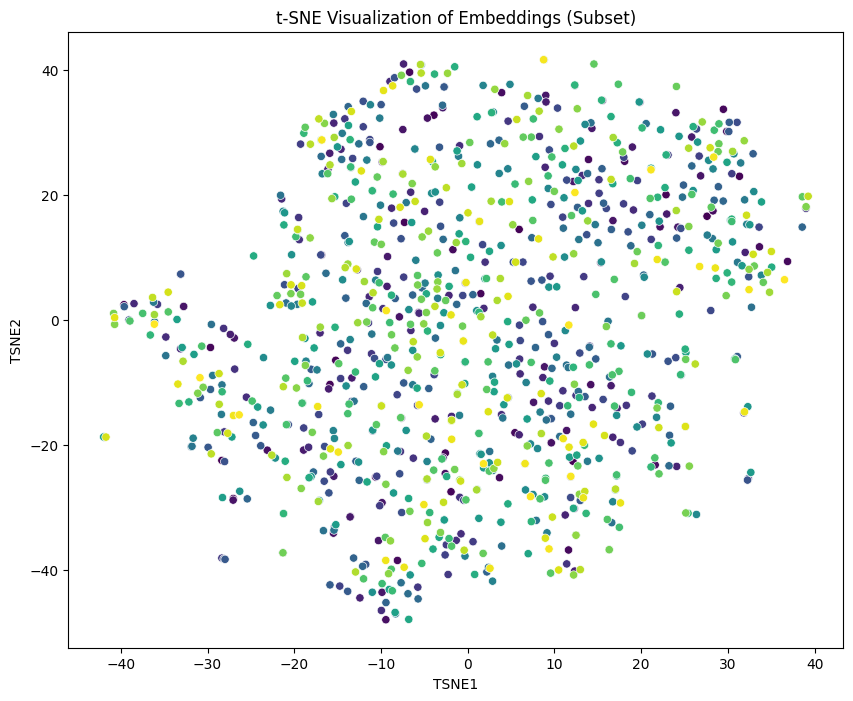

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Randomly sample a subset of your DataFrame (because it lasts very long to plot all of them)
sample_size = 1000  # Adjust as needed
df_sample = df.sample(n=sample_size, random_state=42)

# Use t-SNE for dimensionality reduction on the subset
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(np.vstack(list(df_sample['Embeddings'])))

# Add the t-SNE components to the DataFrame
df_sample['TSNE1'] = embeddings_2d[:, 0]
df_sample['TSNE2'] = embeddings_2d[:, 1]

# Create a scatter plot using seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='ProteinID', data=df_sample, palette='viridis', legend=False)
plt.title('t-SNE Visualization of Embeddings (Subset)')
plt.show()

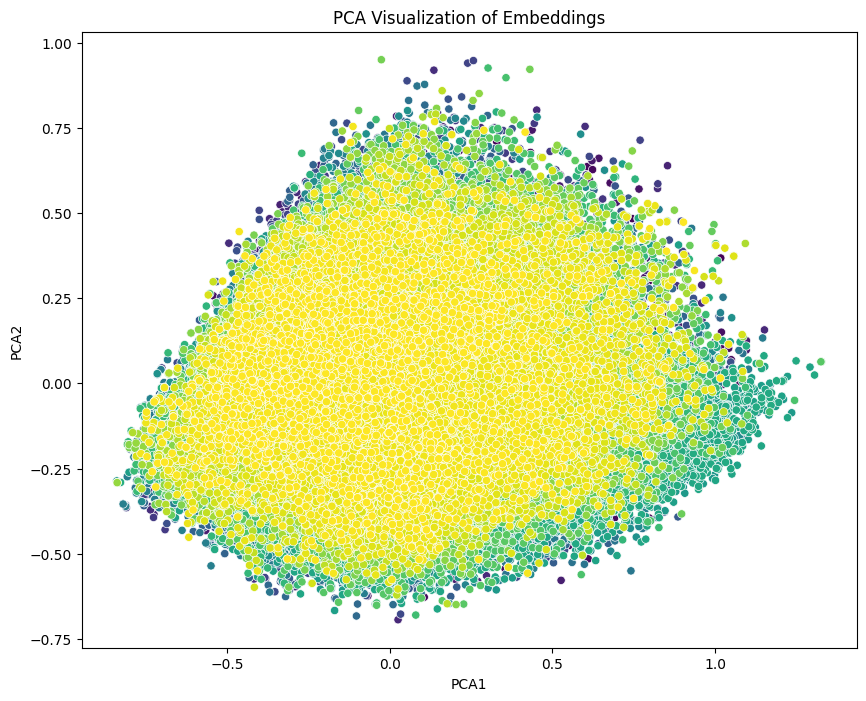

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Use PCA for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
embeddings_2d = pca.fit_transform(np.vstack(df['Embeddings']))

# Add the PCA components to the DataFrame
df['PCA1'] = embeddings_2d[:, 0]
df['PCA2'] = embeddings_2d[:, 1]

# Create a scatter plot using seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='ProteinID', data=df, palette='viridis', legend=False)
plt.title('PCA Visualization of Embeddings')
plt.show()


In [6]:
import numpy as np

# Load embeddings from the numpy file
npy_file_domain_embeddings = PATH + 'train/domain_embeddings_pca.npy'
loaded_domain_embeddings = np.load(npy_file_domain_embeddings)

In [7]:
loaded_domain_embeddings.shape

(117447, 1024)

<ipython-input-8-c76ae436dc80>:16: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x='PCA1', y='PCA2', data=df, palette='viridis', legend='full')


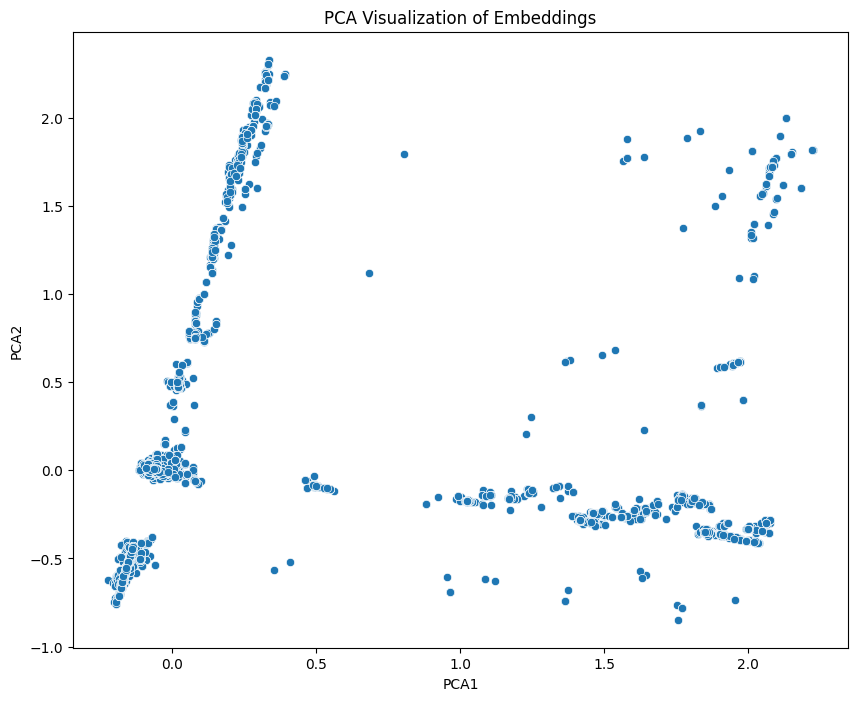

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Use PCA for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
embeddings_2d = pca.fit_transform(loaded_domain_embeddings)

# Create a DataFrame for visualization
df = pd.DataFrame(data=embeddings_2d, columns=['PCA1', 'PCA2'])

# Create a scatter plot using seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PCA1', y='PCA2', data=df, palette='viridis', legend='full')
plt.title('PCA Visualization of Embeddings')
plt.show()

# Protein vs Labels (GO Terms) Plots

In [3]:
import seaborn as sns

def plot_1(data_raw, aspect, set):
    rowSums = data_raw.iloc[:,:].sum(axis=1)
    multiLabel_counts = rowSums.value_counts()
    multiLabel_counts = multiLabel_counts.iloc[:]
    multiLabel_counts = multiLabel_counts.sort_index(ascending=True)

    # Define a threshold value above which bars will have different colors
    threshold = 2000
    sns.set(font_scale=5)
    plt.figure(figsize=(100, 50))

    # Create a color map
    colors = ['red' if value > threshold else 'orange' for value in multiLabel_counts.values[:25]]

    # Plot the bar chart with specified colors
    ax = sns.barplot(x=multiLabel_counts.index.values[:25], y=multiLabel_counts.values[:25], hue=multiLabel_counts.index.values[:25], palette=colors, legend=False)

    plt.title("Distribution of the number of labels assigned vs \nthe number of proteins having that many labels assigned (" + str(aspect) + " " + str(set) + ")", fontsize=100)
    plt.ylabel('Number of proteins having that number of labels assigned', fontsize=80)
    plt.xlabel('Number of labels', fontsize=80)

    # Adding the text labels
    rects = ax.patches
    labels = multiLabel_counts.values[:25]

    for rect, label in zip(rects, labels):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width() / 2, height + 5, label, ha='center', va='bottom')

    # plt.savefig(PATH + 'plots/' + str(aspect) + "_" + str(set) + '_plot2.png')
    plt.show()


def plot_2(data_raw, aspect, set):
    rowSums = data_raw.iloc[:, :].sum(axis=1)
    rowSums_sorted = rowSums.sort_values(ascending=False)

    # Define a threshold value above which bars will have different colors
    threshold = 69
    sns.set(font_scale=5)
    plt.figure(figsize=(120, 50))

    # Create a color map
    # colors = ['red' if value > threshold else 'orange' for value in rowSums_sorted]
    warm_to_cold_palette = sns.color_palette("coolwarm", n_colors=len(rowSums_sorted[:30]))


    # Plot the bar chart with specified colors
    ax = sns.barplot(x=rowSums_sorted.index[:30], y=rowSums_sorted[:30].values, hue=rowSums_sorted.index[:30], palette=warm_to_cold_palette)

    plt.title("Distribution of the number of assigned terms to proteins (" + str(aspect) + " " + str(set) + ")", fontsize=100)
    plt.ylabel('Number of terms assigned', fontsize=80)
    plt.xlabel('Protein id', fontsize=80)

    # Adding the text labels
    rects = ax.patches
    labels = rowSums_sorted.values
    for rect, label in zip(rects, labels):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width() / 2, height, label, ha='center', va='bottom')

    # plt.savefig(PATH + 'plots/' + str(aspect) + "_" + str(set) + '_plot1.png')
    plt.show()



# Loading datasets and features

In [4]:
import tensorflow as tf
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Required for progressbar widget
import progressbar

In [21]:
train_set_df = pd.read_csv(GENERATED_TRAIN_SET_PATH, sep='\t')

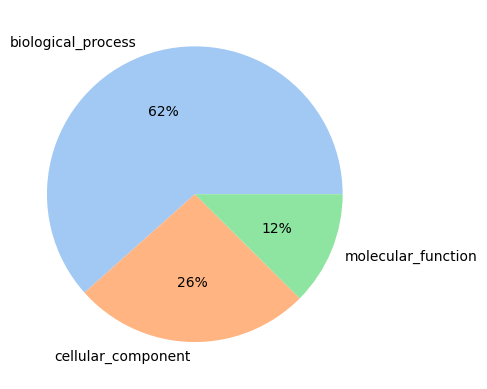

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

def show_pit_aspects():
    pie_df = train_set_df['aspect'].value_counts()
    palette_color = sns.color_palette('pastel')
    plt.pie(pie_df.values, labels=np.array(pie_df.index), colors=palette_color, autopct='%.0f%%')
    plt.show()

show_pit_aspects()

In [23]:
validation_set_df = pd.read_csv(GENERATED_VALIDATION_SET_PATH, sep='\t')

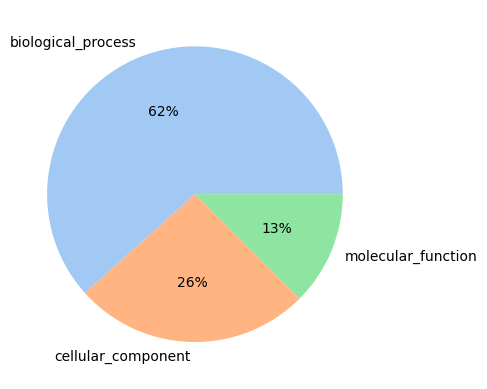

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

def show_pit_aspects():
    pie_df = validation_set_df['aspect'].value_counts()
    palette_color = sns.color_palette('pastel')
    plt.pie(pie_df.values, labels=np.array(pie_df.index), colors=palette_color, autopct='%.0f%%')
    plt.show()

show_pit_aspects()

In [7]:
import numpy as np

# Load embeddings from the numpy file
X_loaded = np.load(npy_file_path_embeddings)

# Load IDs from the numpy file
ids_loaded = np.load(npy_file_path_ids)

In [8]:
# Now lets convert embeddings numpy array(train_embeddings) into pandas dataframe.
column_num = X_loaded.shape[1]
t5_df = pd.DataFrame(X_loaded, columns = ["Column_" + str(i) for i in range(1, column_num+1)])
t5_df.set_index(pd.Index(ids_loaded), inplace=True)

print(t5_df.shape)

(123969, 1024)


In [9]:
del X_loaded

In [10]:
import numpy as np

domain_embeddings = np.load(domain_pca_embeddings_path)

In [11]:
domain_embeddings_ids = np.load(npy_file_path_ids_pca, allow_pickle=True)

In [12]:
# Now lets convert embeddings numpy array(train_embeddings) into pandas dataframe.
column_num = domain_embeddings.shape[1]
domains_df = pd.DataFrame(domain_embeddings, columns = ["Column_" + str(i+1024) for i in range(1, column_num+1)])
domains_df.set_index(pd.Index(domain_embeddings_ids), inplace=True)

print(domains_df.shape)

(117447, 1024)


In [13]:
del domain_embeddings

In [14]:
complete_df = pd.merge(t5_df, domains_df, left_index=True, right_index=True, how='inner')

In [15]:
del t5_df, domains_df

In [16]:
# Assuming "Protein_ID" is the column with protein IDs in train_set_df
train_df = complete_df[complete_df.index.isin(train_set_df['Protein_ID'])]

# Assuming "Protein_ID" is the column with protein IDs in validation_set_df
validation_df = complete_df[complete_df.index.isin(validation_set_df['Protein_ID'])]

In [17]:
import pandas as pd

def split_dataframe_by_column(df, column_name):
    # Group the DataFrame by the specified column
    grouped = df.groupby(column_name)

    # Create a dictionary to store the resulting DataFrames
    result_dict = {}

    # Iterate through the groups and store each DataFrame in the dictionary
    for group, group_df in grouped:
        result_dict[group] = group_df

    return result_dict

train_set_splitted = split_dataframe_by_column(train_set_df, 'aspect')
validation_set_splitted = split_dataframe_by_column(validation_set_df, 'aspect')

# Cellular Component

In [18]:
train_set_aspect = train_set_splitted['cellular_component']
train_set_aspect

,Protein_ID,aspect,GO_term
0,Q55DL5,cellular_component,GO:0005575
1,Q55DL5,cellular_component,GO:0110165
2,Q55DL5,cellular_component,GO:0005622
3,Q55DL5,cellular_component,GO:0043226
4,Q55DL5,cellular_component,GO:0030139
...,...,...,...
3419014,P28271,cellular_component,GO:0043226
3419015,P28271,cellular_component,GO:0005739
3419016,P28271,cellular_component,GO:0043231
3419017,P28271,cellular_component,GO:0043227


In [19]:
validation_set_aspect = validation_set_splitted['cellular_component']
validation_set_aspect

,Protein_ID,aspect,GO_term
0,P91124,cellular_component,GO:0005575
1,P91124,cellular_component,GO:0110165
2,P91124,cellular_component,GO:0005737
3,P91124,cellular_component,GO:0005622
4,P91124,cellular_component,GO:0043226
...,...,...,...
858008,P63001,cellular_component,GO:0031253
858009,P63001,cellular_component,GO:0031256
858010,P63001,cellular_component,GO:0032587
858011,P63001,cellular_component,GO:0001726


In [20]:
# Set the limit for label
num_of_labels = len(train_set_aspect['GO_term'].value_counts())

# Take value counts in descending order and fetch first 1500 `GO term ID` as labels
labels = train_set_aspect['GO_term'].value_counts().index[:num_of_labels].tolist()

In [21]:
# Fetch the train_terms data for the relevant labels only
train_terms_updated = train_set_aspect.loc[train_set_aspect['GO_term'].isin(labels)]
validation_terms_updated = validation_set_aspect.loc[validation_set_aspect['GO_term'].isin(labels)]

## One-hot encodding of the labels for train

In [22]:
ids_to_load_train = np.array(train_df.index)

In [23]:
# Setup progressbar settings.
# This is strictly for aesthetic.
bar = progressbar.ProgressBar(maxval=num_of_labels, \
    widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])

# Create an empty dataframe of required size for storing the labels,
# i.e, train_size x num_of_labels (142246 x 1500)
train_size = ids_to_load_train.shape[0] # len(X)
train_labels = np.zeros((train_size ,num_of_labels))

# Convert from numpy to pandas series for better handling
series_train_protein_ids = pd.Series(ids_to_load_train)

# Loop through each label
for i in range(num_of_labels):
    # For each label, fetch the corresponding train_terms data
    n_train_terms = train_terms_updated[train_terms_updated['GO_term'] ==  labels[i]]

    # Fetch all the unique EntryId aka proteins related to the current label(GO term ID)
    label_related_proteins = n_train_terms['Protein_ID'].unique()

    # In the series_train_protein_ids pandas series, if a protein is related
    # to the current label, then mark it as 1, else 0.
    # Replace the ith column of train_Y with with that pandas series.
    train_labels[:,i] =  series_train_protein_ids.isin(label_related_proteins).astype(float)

    # Progress bar percentage increase
    bar.update(i+1)

# Notify the end of progress bar
bar.finish()

# Convert train_Y numpy into pandas dataframe
labels_df_train = pd.DataFrame(data = train_labels, columns = labels)
print(labels_df_train.shape)

[========================================================================] 100%


(93978, 678)


In [24]:
labels_df_train.index = ids_to_load_train

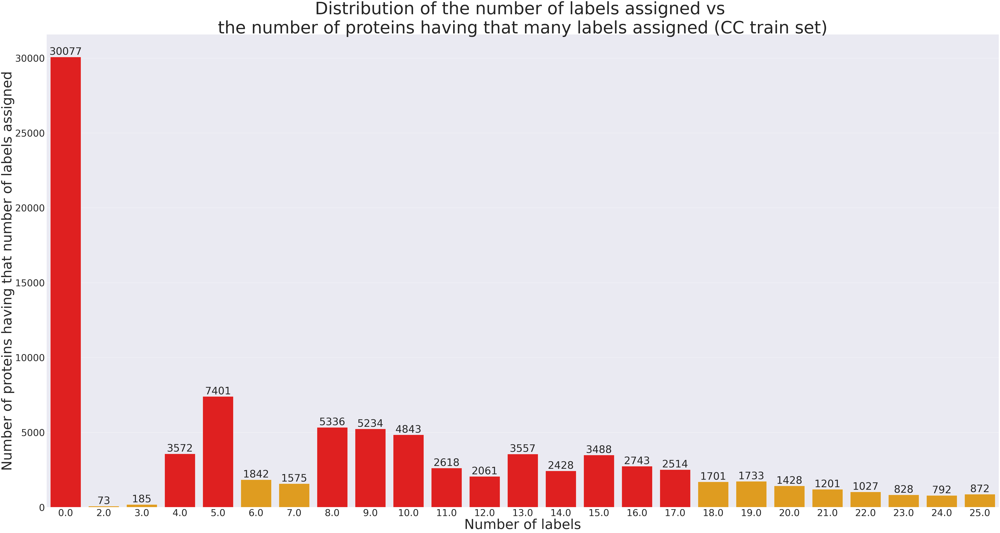

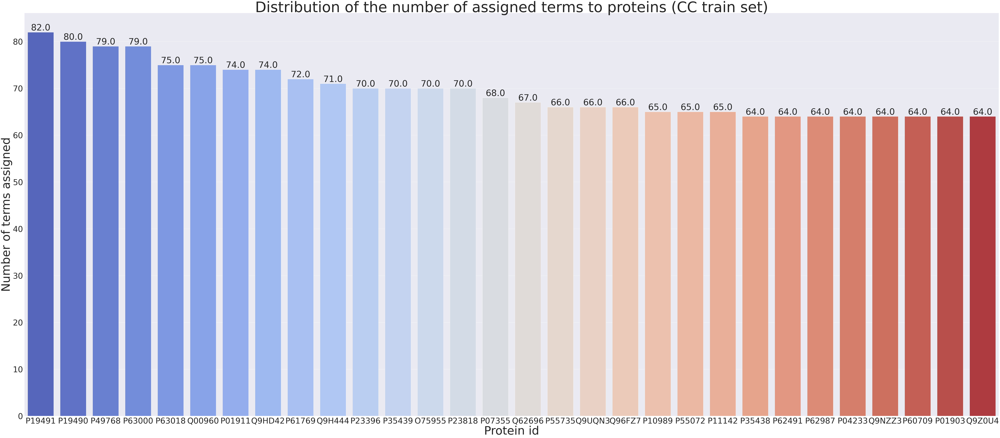

In [25]:
plot_1(labels_df_train, "CC", "train set")
print()
plot_2(labels_df_train, "CC", "train set")

## One-hot encodding of the labels for validation

In [26]:
ids_to_load_validation = np.array(validation_df.index)

In [27]:
# Setup progressbar settings.
# This is strictly for aesthetic.
bar = progressbar.ProgressBar(maxval=num_of_labels, \
    widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])

# Create an empty dataframe of required size for storing the labels,
# i.e, validation_size x num_of_labels (142246 x 1500)
validation_size = ids_to_load_validation.shape[0] # len(X)
validation_labels = np.zeros((validation_size ,num_of_labels))

# Convert from numpy to pandas series for better handling
series_validation_protein_ids = pd.Series(ids_to_load_validation)

# Loop through each label
for i in range(num_of_labels):
    # For each label, fetch the corresponding validation_terms data
    n_validation_terms = validation_terms_updated[validation_terms_updated['GO_term'] ==  labels[i]]

    # Fetch all the unique EntryId aka proteins related to the current label(GO term ID)
    label_related_proteins = n_validation_terms['Protein_ID'].unique()

    # In the series_validation_protein_ids pandas series, if a protein is related
    # to the current label, then mark it as 1, else 0.
    # Replace the ith column of validation_Y with with that pandas series.
    validation_labels[:,i] =  series_validation_protein_ids.isin(label_related_proteins).astype(float)

    # Progress bar percentage increase
    bar.update(i+1)

# Notify the end of progress bar
bar.finish()

# Convert validation_Y numpy into pandas dataframe
labels_df_validation = pd.DataFrame(data = validation_labels, columns = labels)
print(labels_df_validation.shape)

[========================================================================] 100%


(23469, 678)


In [28]:
labels_df_validation.index = ids_to_load_validation

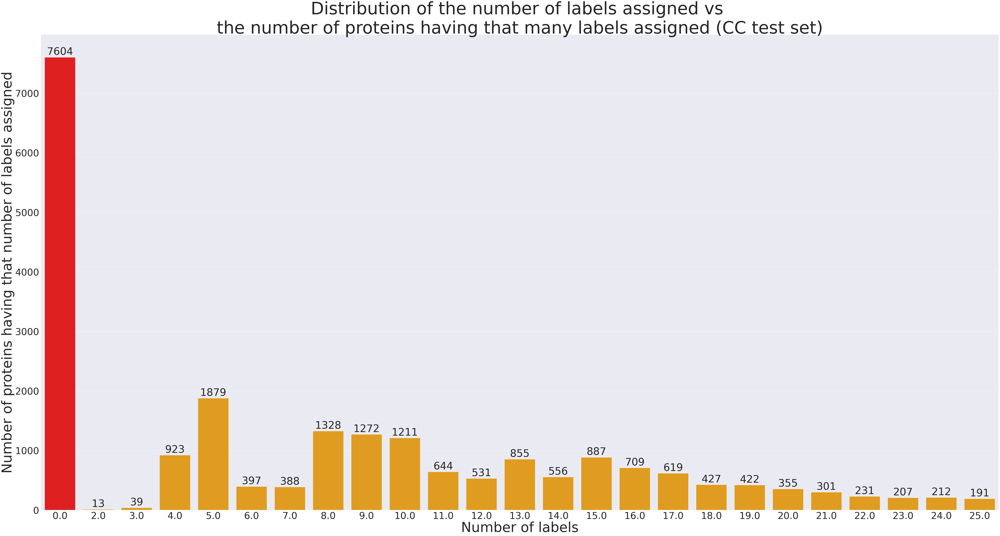

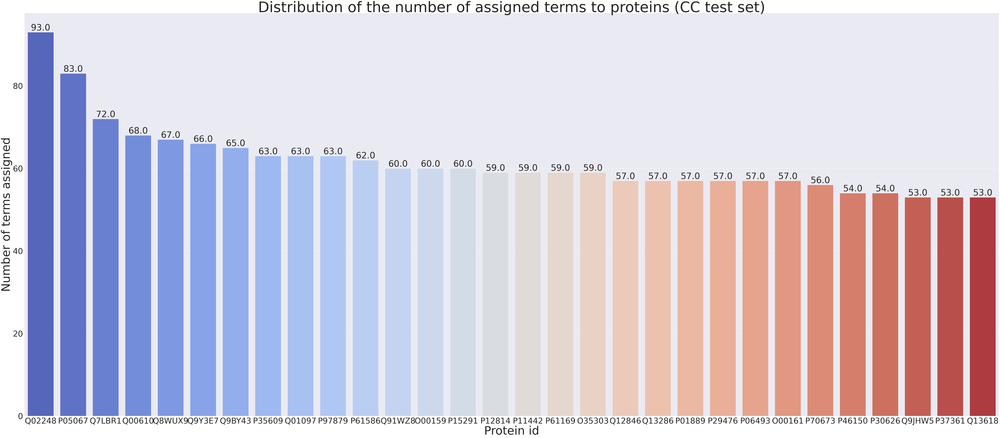

In [29]:
plot_1(labels_df_validation, "CC", "test set")
print()
plot_2(labels_df_validation, "CC", "test set")

# Molecular Function

In [30]:
train_set_aspect = train_set_splitted['molecular_function']
train_set_aspect

,Protein_ID,aspect,GO_term
13,O81027,molecular_function,GO:0016830
14,O81027,molecular_function,GO:0016829
15,O81027,molecular_function,GO:0016833
16,O81027,molecular_function,GO:0003824
17,O81027,molecular_function,GO:0003674
...,...,...,...
3418974,P28271,molecular_function,GO:0003676
3418975,P28271,molecular_function,GO:0003729
3418976,P28271,molecular_function,GO:0003723
3418977,P28271,molecular_function,GO:0097159


In [31]:
validation_set_aspect = validation_set_splitted['molecular_function']
validation_set_aspect

,Protein_ID,aspect,GO_term
26,P91124,molecular_function,GO:0005488
27,P91124,molecular_function,GO:0003674
28,P91124,molecular_function,GO:0005515
29,P91124,molecular_function,GO:0051020
30,P91124,molecular_function,GO:0019899
...,...,...,...
857823,P63001,molecular_function,GO:0036094
857824,P63001,molecular_function,GO:0032553
857825,P63001,molecular_function,GO:0019001
857826,P63001,molecular_function,GO:0035639


In [32]:
# Set the limit for label
num_of_labels = len(train_set_aspect['GO_term'].value_counts())

# Take value counts in descending order and fetch first 1500 `GO term ID` as labels
labels = train_set_aspect['GO_term'].value_counts().index[:num_of_labels].tolist()

In [33]:
# Fetch the train_terms data for the relevant labels only
train_terms_updated = train_set_aspect.loc[train_set_aspect['GO_term'].isin(labels)]
validation_terms_updated = validation_set_aspect.loc[validation_set_aspect['GO_term'].isin(labels)]

## One-hot encodding of the labels for train

In [34]:
ids_to_load_train = np.array(train_df.index)

In [35]:
# Setup progressbar settings.
# This is strictly for aesthetic.
bar = progressbar.ProgressBar(maxval=num_of_labels, \
    widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])

# Create an empty dataframe of required size for storing the labels,
# i.e, train_size x num_of_labels (142246 x 1500)
train_size = ids_to_load_train.shape[0] # len(X)
train_labels = np.zeros((train_size ,num_of_labels))

# Convert from numpy to pandas series for better handling
series_train_protein_ids = pd.Series(ids_to_load_train)

# Loop through each label
for i in range(num_of_labels):
    # For each label, fetch the corresponding train_terms data
    n_train_terms = train_terms_updated[train_terms_updated['GO_term'] ==  labels[i]]

    # Fetch all the unique EntryId aka proteins related to the current label(GO term ID)
    label_related_proteins = n_train_terms['Protein_ID'].unique()

    # In the series_train_protein_ids pandas series, if a protein is related
    # to the current label, then mark it as 1, else 0.
    # Replace the ith column of train_Y with with that pandas series.
    train_labels[:,i] =  series_train_protein_ids.isin(label_related_proteins).astype(float)

    # Progress bar percentage increase
    bar.update(i+1)

# Notify the end of progress bar
bar.finish()

# Convert train_Y numpy into pandas dataframe
labels_df_train = pd.DataFrame(data = train_labels, columns = labels)
print(labels_df_train.shape)

[========================================================================] 100%


(93978, 839)


In [36]:
labels_df_train.index = ids_to_load_train

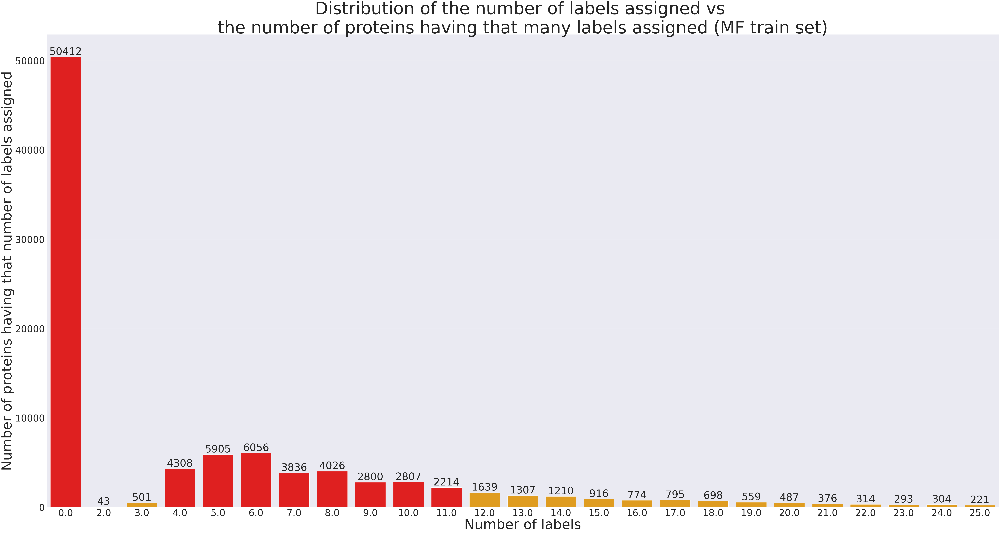

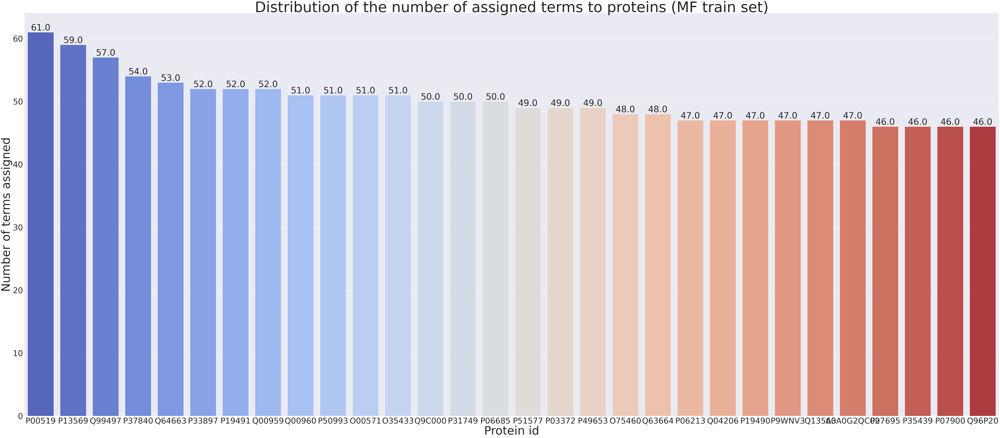

In [37]:
plot_1(labels_df_train, "MF", "train set")
print()
plot_2(labels_df_train, "MF", "train set")

## One-hot encodding of the labels for validation

In [38]:
ids_to_load_validation = np.array(validation_df.index)

In [39]:
# Setup progressbar settings.
# This is strictly for aesthetic.
bar = progressbar.ProgressBar(maxval=num_of_labels, \
    widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])

# Create an empty dataframe of required size for storing the labels,
# i.e, validation_size x num_of_labels (142246 x 1500)
validation_size = ids_to_load_validation.shape[0] # len(X)
validation_labels = np.zeros((validation_size ,num_of_labels))

# Convert from numpy to pandas series for better handling
series_validation_protein_ids = pd.Series(ids_to_load_validation)

# Loop through each label
for i in range(num_of_labels):
    # For each label, fetch the corresponding validation_terms data
    n_validation_terms = validation_terms_updated[validation_terms_updated['GO_term'] ==  labels[i]]

    # Fetch all the unique EntryId aka proteins related to the current label(GO term ID)
    label_related_proteins = n_validation_terms['Protein_ID'].unique()

    # In the series_validation_protein_ids pandas series, if a protein is related
    # to the current label, then mark it as 1, else 0.
    # Replace the ith column of validation_Y with with that pandas series.
    validation_labels[:,i] =  series_validation_protein_ids.isin(label_related_proteins).astype(float)

    # Progress bar percentage increase
    bar.update(i+1)

# Notify the end of progress bar
bar.finish()

# Convert validation_Y numpy into pandas dataframe
labels_df_validation = pd.DataFrame(data = validation_labels, columns = labels)
print(labels_df_validation.shape)

[========================================================================] 100%


(23469, 839)


In [40]:
labels_df_validation.index = ids_to_load_validation

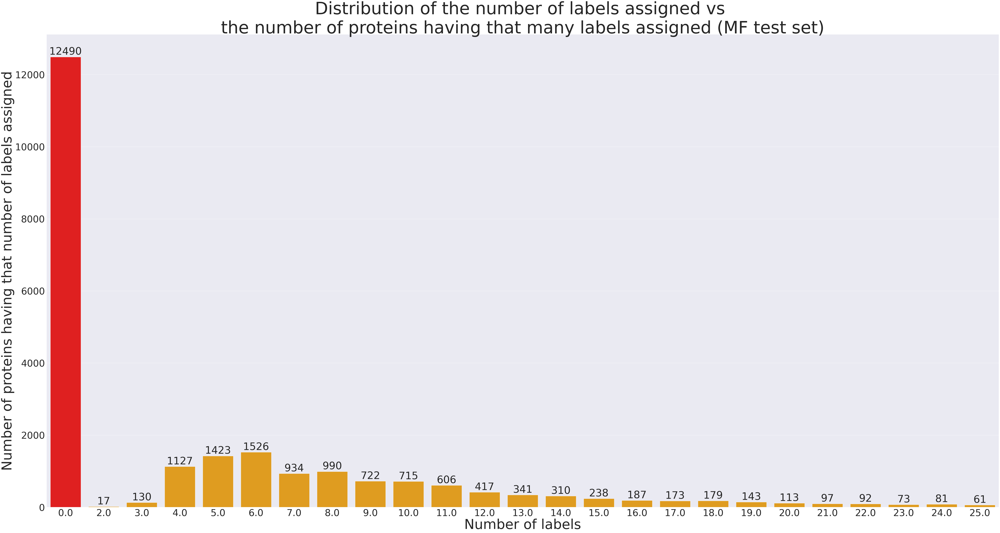

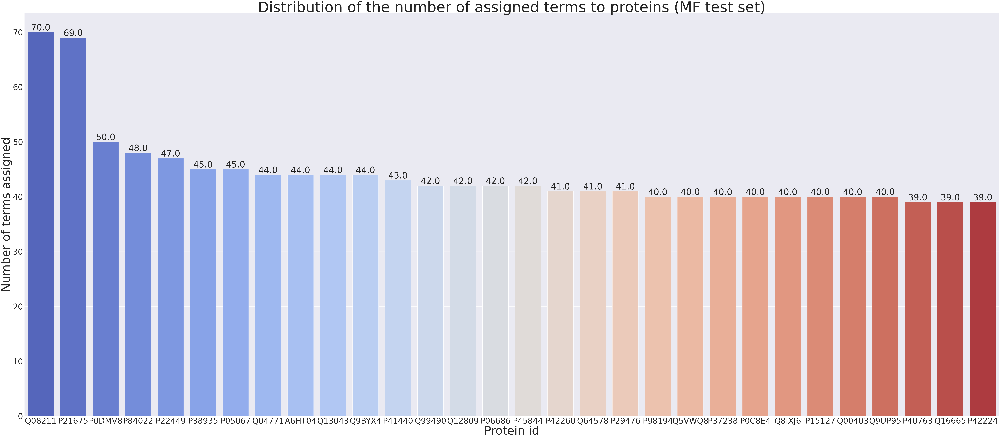

In [41]:
plot_1(labels_df_validation, "MF", "test set")
print()
plot_2(labels_df_validation, "MF", "test set")

# Biological Process

In [42]:
train_set_aspect = train_set_splitted['biological_process']
train_set_aspect

,Protein_ID,aspect,GO_term
41,Q7ZT12,biological_process,GO:0071310
42,Q7ZT12,biological_process,GO:0044419
43,Q7ZT12,biological_process,GO:0071219
44,Q7ZT12,biological_process,GO:0043207
45,Q7ZT12,biological_process,GO:0071222
...,...,...,...
3419020,P28271,biological_process,GO:0010608
3419021,P28271,biological_process,GO:0080090
3419022,P28271,biological_process,GO:0006417
3419023,P28271,biological_process,GO:0051246


In [43]:
validation_set_aspect = validation_set_splitted['biological_process']
validation_set_aspect

,Protein_ID,aspect,GO_term
10,P91124,biological_process,GO:0008150
11,P91124,biological_process,GO:0050789
12,P91124,biological_process,GO:0050795
13,P91124,biological_process,GO:0051239
14,P91124,biological_process,GO:0065007
...,...,...,...
858017,P63001,biological_process,GO:0040017
858018,P63001,biological_process,GO:0002684
858019,P63001,biological_process,GO:0002685
858020,P63001,biological_process,GO:0030335


In [44]:
# Set the limit for label
num_of_labels = len(train_set_aspect['GO_term'].value_counts())

# Take value counts in descending order and fetch first 1500 `GO term ID` as labels
labels = train_set_aspect['GO_term'].value_counts().index[:num_of_labels].tolist()

In [45]:
# Fetch the train_terms data for the relevant labels only
train_terms_updated = train_set_aspect.loc[train_set_aspect['GO_term'].isin(labels)]
validation_terms_updated = validation_set_aspect.loc[validation_set_aspect['GO_term'].isin(labels)]

## One-hot encodding of the labels for train

In [46]:
ids_to_load_train = np.array(train_df.index)

In [47]:
# Setup progressbar settings.
# This is strictly for aesthetic.
bar = progressbar.ProgressBar(maxval=num_of_labels, \
    widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])

# Create an empty dataframe of required size for storing the labels,
# i.e, train_size x num_of_labels (142246 x 1500)
train_size = ids_to_load_train.shape[0] # len(X)
train_labels = np.zeros((train_size ,num_of_labels))

# Convert from numpy to pandas series for better handling
series_train_protein_ids = pd.Series(ids_to_load_train)

# Loop through each label
for i in range(num_of_labels):
    # For each label, fetch the corresponding train_terms data
    n_train_terms = train_terms_updated[train_terms_updated['GO_term'] ==  labels[i]]

    # Fetch all the unique EntryId aka proteins related to the current label(GO term ID)
    label_related_proteins = n_train_terms['Protein_ID'].unique()

    # In the series_train_protein_ids pandas series, if a protein is related
    # to the current label, then mark it as 1, else 0.
    # Replace the ith column of train_Y with with that pandas series.
    train_labels[:,i] =  series_train_protein_ids.isin(label_related_proteins).astype(float)

    # Progress bar percentage increase
    bar.update(i+1)

# Notify the end of progress bar
bar.finish()

# Convert train_Y numpy into pandas dataframe
labels_df_train = pd.DataFrame(data = train_labels, columns = labels)
print(labels_df_train.shape)

[========================================================================] 100%


(93978, 1487)


In [48]:
labels_df_train.index = ids_to_load_train

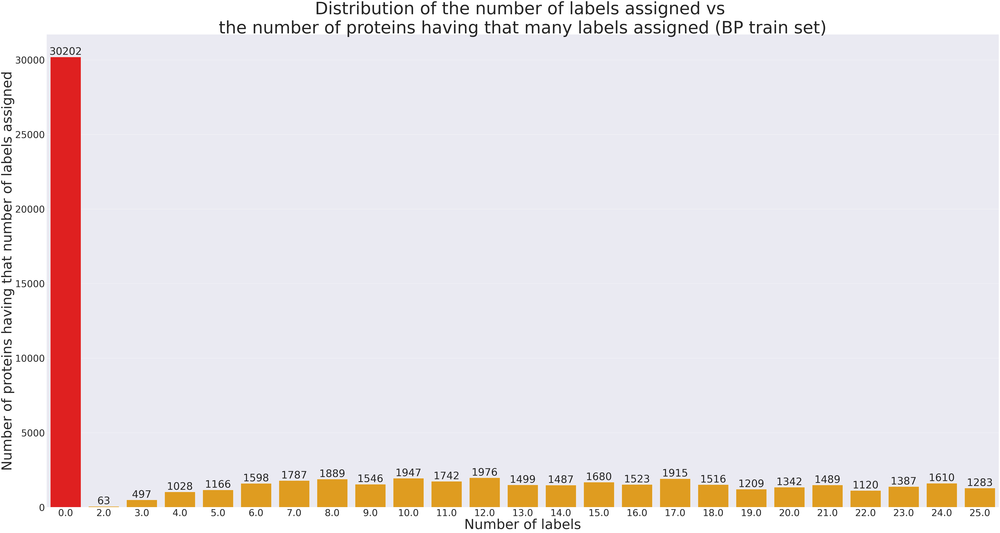

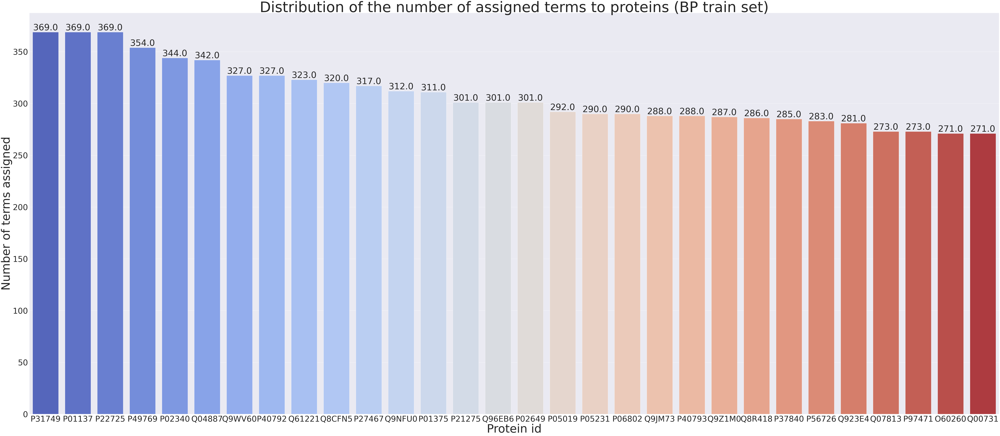

In [49]:
plot_1(labels_df_train, "BP", "train set")
print()
plot_2(labels_df_train, "BP", "train set")

## One-hot encodding of the labels for validation

In [50]:
ids_to_load_validation = np.array(validation_df.index)

In [51]:
# Setup progressbar settings.
# This is strictly for aesthetic.
bar = progressbar.ProgressBar(maxval=num_of_labels, \
    widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])

# Create an empty dataframe of required size for storing the labels,
# i.e, validation_size x num_of_labels (142246 x 1500)
validation_size = ids_to_load_validation.shape[0] # len(X)
validation_labels = np.zeros((validation_size ,num_of_labels))

# Convert from numpy to pandas series for better handling
series_validation_protein_ids = pd.Series(ids_to_load_validation)

# Loop through each label
for i in range(num_of_labels):
    # For each label, fetch the corresponding validation_terms data
    n_validation_terms = validation_terms_updated[validation_terms_updated['GO_term'] ==  labels[i]]

    # Fetch all the unique EntryId aka proteins related to the current label(GO term ID)
    label_related_proteins = n_validation_terms['Protein_ID'].unique()

    # In the series_validation_protein_ids pandas series, if a protein is related
    # to the current label, then mark it as 1, else 0.
    # Replace the ith column of validation_Y with with that pandas series.
    validation_labels[:,i] =  series_validation_protein_ids.isin(label_related_proteins).astype(float)

    # Progress bar percentage increase
    bar.update(i+1)

# Notify the end of progress bar
bar.finish()

# Convert validation_Y numpy into pandas dataframe
labels_df_validation = pd.DataFrame(data = validation_labels, columns = labels)
print(labels_df_validation.shape)

[========================================================================] 100%


(23469, 1487)


In [52]:
labels_df_validation.index = ids_to_load_validation

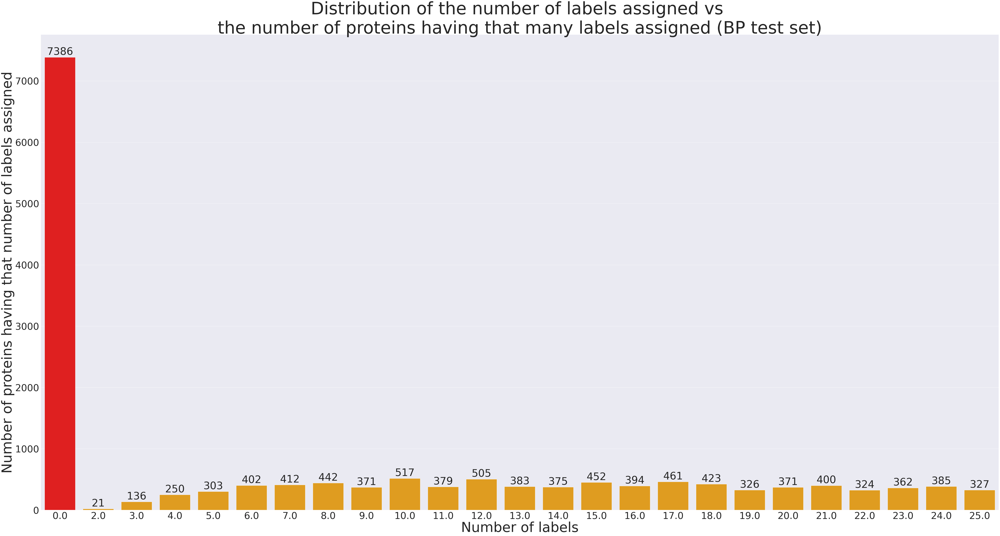

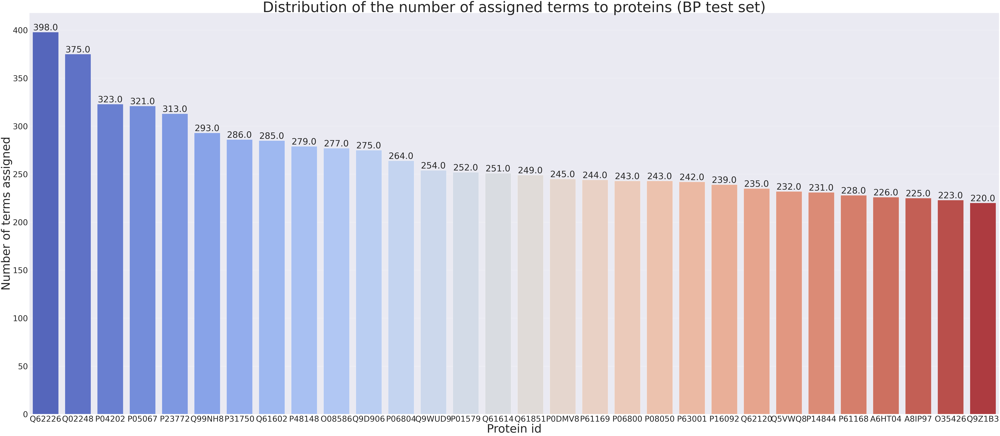

In [53]:
plot_1(labels_df_validation, "BP", "test set")
print()
plot_2(labels_df_validation, "BP", "test set")